In [1]:
import glob
import ast
import time
import numpy as np
import pandas as pd
from tqdm import tqdm 
import cv2
from PIL import Image
import re
import json
import joblib
import collections
import sys, os
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import zipfile

from tqdm import tqdm
import shutil

from pathlib import Path

here_path = Path().resolve()
repo_path = here_path.parents[0]
sys.path.append(str(repo_path))

#module_path = os.path.abspath(os.path.join('../../'))
#if module_path not in sys.path:
#    sys.path.append(module_path)

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Loading package

In [3]:
from py.utils import verifyDir,verifyFile, verifyDataFrame

In [4]:
from datetime import datetime

current_time = datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
# current_time = "2025-03-31_17:22:37"
current_time = '2025-07-16_15:41:48'

In [5]:
ML_TASK = "classifications"
MODEL_NAME = "RandomForest"
METRIC = "safety"

In [6]:
DATA_PATH = f"{repo_path}/data/pp2/"
ADE20K_DIR = f"{repo_path}/data/ade20k/"
USD4K_DIR = f"{repo_path}/data/upd4k/"
QSCORE_PATH=f"{DATA_PATH}processed/Qscores/All/Scores/"

MODEL_DIR = f"{repo_path}/data/pp2/scene_{ML_TASK}/{MODEL_NAME}/{current_time}/{METRIC}/"

In [7]:
verifyDir(MODEL_DIR)

### Loading segmentations

In [8]:
from py.datasets.dataprocess.urban_streets import UrbanPhysicalDisorder

SEG_DATASET = "ade20k_upd4k"

uss = UrbanPhysicalDisorder()
uss.read_ade20k_classes(ADE20K_DIR)
uss.read_upd4k_classes(USD4K_DIR)
uss.generate_dataset(dataset=f"{SEG_DATASET}")

#### Parameters

In [9]:
CITY_STUDIED="Rio De Janeiro"
USE_UPD=True
FILTER_FEATURES=True
BY_GROUPS=True
BINARIZE_VALUES=False

In [10]:
SEGMENT_DIR = f"{DATA_PATH}scene_parsers/"
SEGMENT_DIR += "UrbanPhysicalDisorder/upd4k" if USE_UPD and CITY_STUDIED.lower()!="all" else "OneFormer_Swin_large/ade20k"
SEGMENT_DIR += "_group/" if BY_GROUPS else "/"
# SEGMENT_DIR += f"{CITY_STUDIED}/" if CITY_STUDIED.lower()!="all" else ""
SEGMENT_DIR

'/media/felipe/DATA19/github/FGV/PlacePulse/data/pp2/scene_parsers/UrbanPhysicalDisorder/upd4k_group/'

In [11]:
segmentations_df = pd.read_csv(f"{SEGMENT_DIR}{CITY_STUDIED}/segmentations.csv", sep=";", low_memory=False)
segmentations_df["seg_image_path"] = f"{SEGMENT_DIR}" + segmentations_df["seg_image_path"]
segmentations_df["seg_overlay_image_path"] = f"{SEGMENT_DIR}" + segmentations_df["seg_overlay_image_path"]
segmentations_df["mask_path"] = f"{SEGMENT_DIR}" + segmentations_df["mask_path"]

if FILTER_FEATURES:
    segmentations_df = uss.filter_features(segmentations_df)

if BY_GROUPS:
    segmentations_df = uss.aggregate_classes_by_groups(segmentations_df)

if BINARIZE_VALUES:
    segmentations_df = uss.binarize_vectors(segmentations_df)

segmentations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3644 entries, 0 to 3643
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   image_id                      3644 non-null   object 
 1   seg_image_path                3644 non-null   object 
 2   seg_overlay_image_path        3644 non-null   object 
 3   mask_path                     3644 non-null   object 
 4   broken_damaged_bricks_wall    3644 non-null   float64
 5   broken_damaged_pavement_road  3644 non-null   float64
 6   city_elements                 3644 non-null   float64
 7   construction                  3644 non-null   float64
 8   floor                         3644 non-null   float64
 9   graffiti                      3644 non-null   float64
 10  human                         3644 non-null   float64
 11  overhead_cable                3644 non-null   float64
 12  sky                           3644 non-null   float64
 13  ter

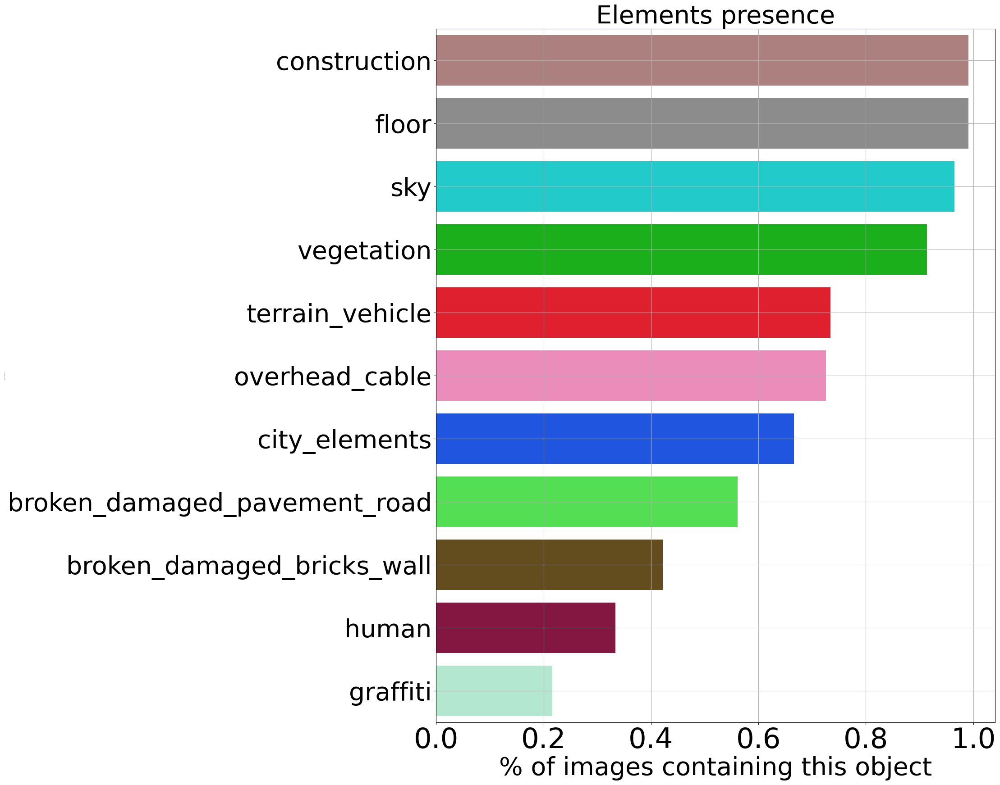

In [12]:
feature_presence = uss.features_presence(segmentations_df.iloc[:, 4:])
uss.print_object_present(feature_presence, fig_size=(16,20), top_k=15)

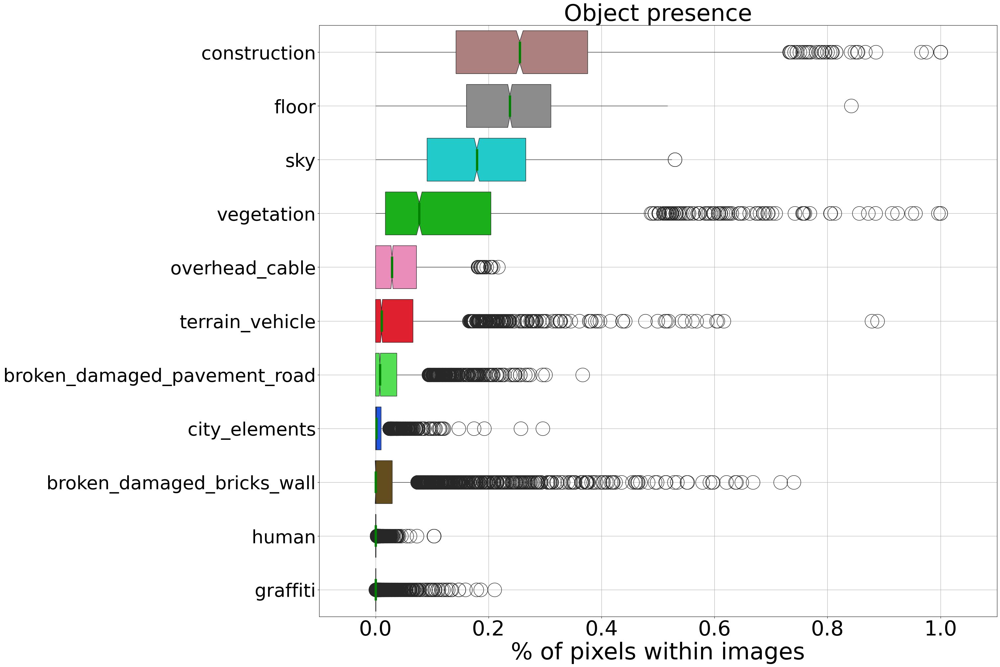

In [13]:
uss.print_object_boxplot(segmentations_df.iloc[:, 4:], fig_size=(30,20), top_k=15)

In [14]:
verifyDataFrame(segmentations_df)

Rows with all zeros: [], size: 0
Columns with all zeros: [], size: 0


### Loading data

In [15]:
scores_df = pd.read_csv(f"{QSCORE_PATH}scores.csv", sep=";", low_memory=False)
dataset_df = pd.merge(scores_df, segmentations_df, on="image_id", how="inner")
dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3644 entries, 0 to 3643
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   image_id                      3644 non-null   object 
 1   lat                           3644 non-null   float64
 2   long                          3644 non-null   float64
 3   city                          3644 non-null   object 
 4   country                       3644 non-null   object 
 5   continent                     3644 non-null   object 
 6   safety                        3644 non-null   float64
 7   beautiful                     3644 non-null   float64
 8   wealthy                       3644 non-null   float64
 9   lively                        3644 non-null   float64
 10  boring                        3644 non-null   float64
 11  depressing                    3644 non-null   float64
 12  image_path                    3644 non-null   object 
 13  seg

Applying u and delta*std
u: 3.98674238014802 std: 1.1949709595772369 superior: 4.94271914780981 inferior: 3.0307656124862308
Top max: 8.07411071970459, min:4.944382985340158, size: 717
Bot max: 3.0303030303030303, min:0.4761904761904764, size: 722


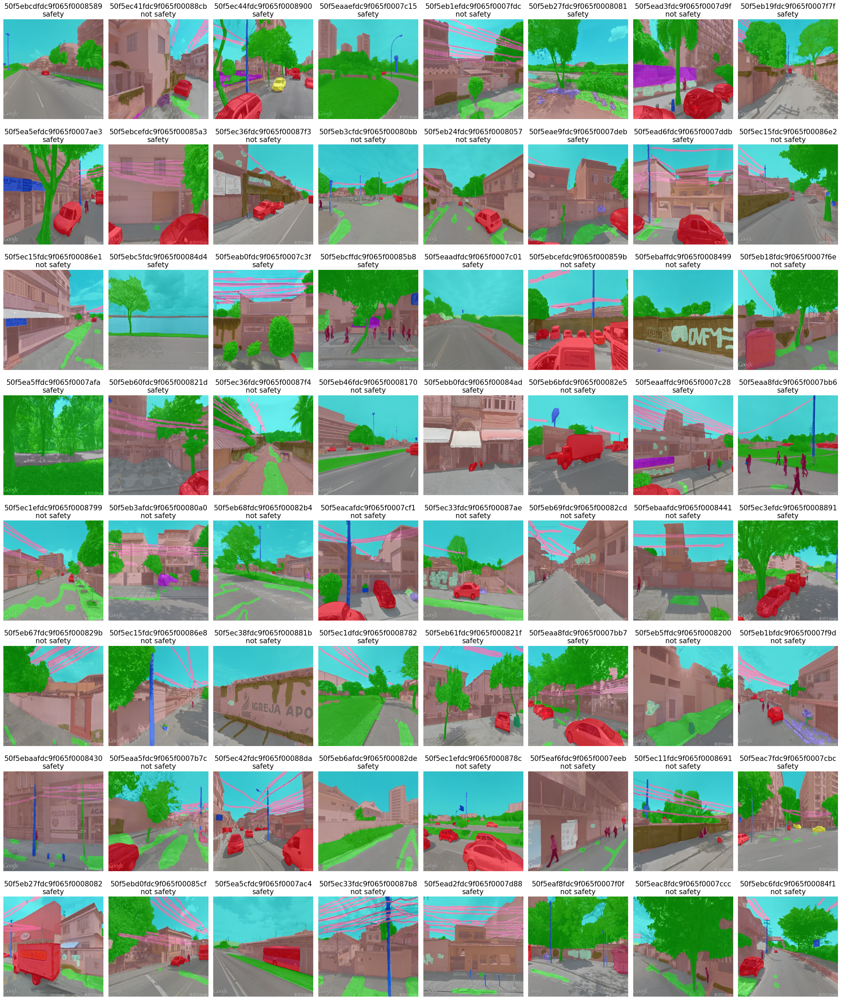

In [16]:
from py.datasets import PlacePulse

pp = PlacePulse(dataset_df)
pp.DataPreparation(delta=0.8, num_classes="std", emotion=METRIC)
pp.DataSplit()
pp.plot(img_to_show="seg_overlay_image_path")

### Loading model

In [17]:
from py.models.supervised.ensemble import EnsembleClassifier

tm = EnsembleClassifier(model_name=MODEL_NAME, scaler_name="standard")
tm.model_zoo()
tm.initialize_grid()
tm.get_model()

Model zoo: ['DecisionTree', 'RandomForest', 'GradientBoosting', 'AdaBoost'] 



GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=5,
             param_grid={'classifier__bootstrap': [True],
                         'classifier__max_depth': [20],
                         'classifier__max_features': [None],
                         'classifier__min_samples_leaf': [3],
                         'classifier__min_samples_split': [6],
                         'classifier__n_estimators': [200]},
             scoring='balanced_accuracy')

### Training

In [18]:
feature_names = pp.train_df.iloc[:, 16:-2].columns.tolist()
X_train = pp.train_df.iloc[:, 16:-2].values
y_train = pp.train_df["class"].tolist()

X_test = pp.test_df.iloc[:, 16:-2].values
y_test = pp.test_df["class"].tolist()

In [19]:
len(feature_names), X_train.shape, X_test.shape

(11, (1079, 11), (360, 11))

In [20]:
collections.Counter(y_train), collections.Counter(y_test)

(Counter({0: 541, 1: 538}), Counter({0: 181, 1: 179}))

In [21]:
tm.model_grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=5,
             param_grid={'classifier__bootstrap': [True],
                         'classifier__max_depth': [20],
                         'classifier__max_features': [None],
                         'classifier__min_samples_leaf': [3],
                         'classifier__min_samples_split': [6],
                         'classifier__n_estimators': [200]},
             scoring='balanced_accuracy')

In [22]:
tm.model_grid.best_score_, tm.model_grid.best_params_

(np.float64(0.6737837447324715),
 {'classifier__bootstrap': True,
  'classifier__max_depth': 20,
  'classifier__max_features': None,
  'classifier__min_samples_leaf': 3,
  'classifier__min_samples_split': 6,
  'classifier__n_estimators': 200})

In [23]:
from sklearn.metrics import classification_report

In [24]:
y_pred = tm.model_grid.predict(X_test)
test_report = classification_report(y_test, y_pred, output_dict=True)

print(classification_report(y_test, y_pred, target_names=list(pp.label_map.values())))

              precision    recall  f1-score   support

  not safety       0.68      0.72      0.70       181
      safety       0.70      0.66      0.68       179

    accuracy                           0.69       360
   macro avg       0.69      0.69      0.69       360
weighted avg       0.69      0.69      0.69       360



In [25]:
confusion_matrix = pd.crosstab(
    pd.Series([pp.label_map[k] for k in y_test], name="Real"),
    pd.Series([pp.label_map[k] for k in y_pred], name="Prediction")
)
confusion_matrix

Prediction,not safety,safety
Real,,
not safety,130,51
safety,60,119


### Feature Importance

In [26]:
import seaborn as sns

In [27]:
importances = tm.model_grid.best_estimator_[1].feature_importances_
# std = np.std([tree.feature_importances_ for tree in tm.model_grid.best_estimator_[1].estimators_], axis=0)

In [28]:
forest_importances = pd.Series(importances, index=feature_names)
forest_importances.sort_values(ascending=False, inplace=True)
forest_importances_df = forest_importances.to_frame()
forest_importances_df.reset_index(inplace=True)
forest_importances

vegetation                      0.174492
broken_damaged_bricks_wall      0.119722
floor                           0.113991
sky                             0.105164
construction                    0.093066
overhead_cable                  0.089870
terrain_vehicle                 0.084091
broken_damaged_pavement_road    0.082013
city_elements                   0.067578
human                           0.044975
graffiti                        0.025038
dtype: float64

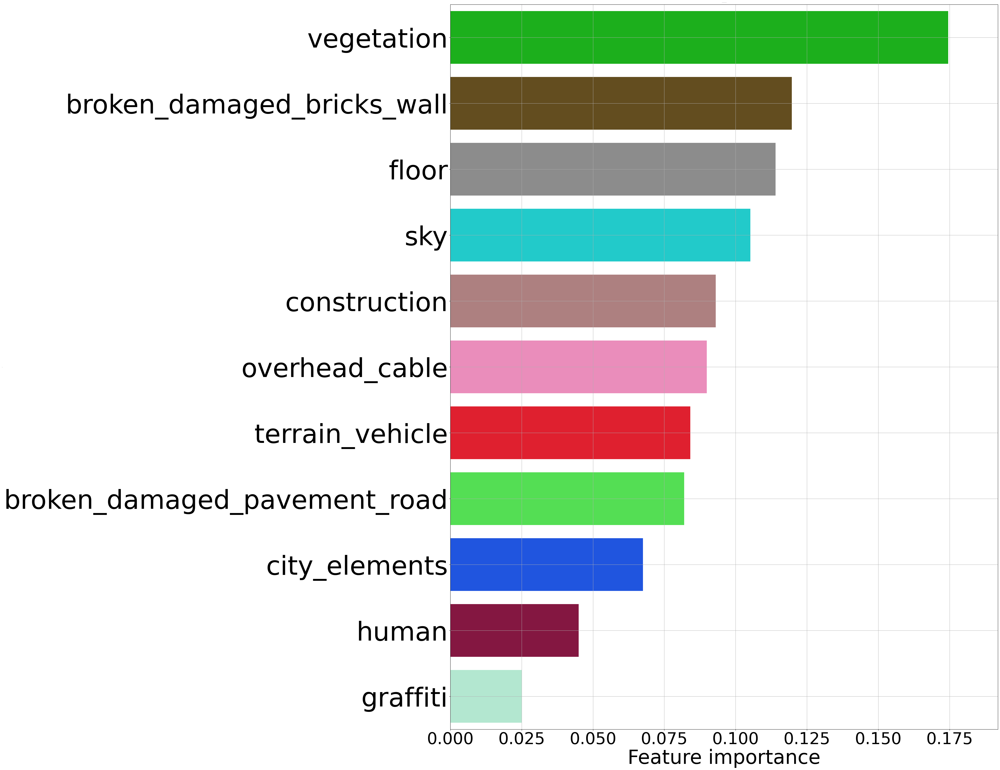

In [29]:
_, ax = plt.subplots(figsize=(30,40), nrows=1, ncols=1, sharex=False, sharey=False)

Top_k_features=15

sns_fig = sns.barplot(
            data=forest_importances_df.iloc[:Top_k_features],
            x=forest_importances_df.iloc[:Top_k_features].columns[1],
            y=forest_importances_df.iloc[:Top_k_features].columns[0],
            orient="h",
            ax=ax,
            palette=uss.color_dict,
            #order=estado_df.sort_values(estado_df.columns[1], ascending=False)[estado_df.columns[0]]
           )

sns_fig.set_title(f"Top {Top_k_features} feature importances", fontsize=0)
sns_fig.set_ylabel(f"Label", fontsize=0)
sns_fig.set_xlabel('Feature importance', fontsize=60)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='x', rotation=0, labelsize=50)

# rotate the axis ticklabels
_ = sns_fig.tick_params(axis='y', labelsize=80)

# add annotation
# _ = sns_fig.bar_label(sns_fig.containers[0], fmt='%.4f', fontsize=15,rotation=0)
ax.grid(True)
# add a space on y for the annotations
sns_fig.margins(x=0.1)
plt.show()

### Saving data and model

In [30]:
dataset_df.to_csv(f"{MODEL_DIR}data.csv", sep=";", index=False)

In [31]:
joblib.dump(tm.model_grid, f'{MODEL_DIR}best_model.pkl')

['/media/felipe/DATA19/github/FGV/PlacePulse/data/pp2/scene_classifications/RandomForest/2025-07-16_15:41:48/safety/best_model.pkl']

In [32]:
with open(f'{MODEL_DIR}test_report.json', "w") as fp:
    json.dump(test_report, fp)

### SHAP

In [33]:
import shap
shap.initjs()

In [34]:
#LinearExplainer
shap_explainer = shap.Explainer(tm.model_grid.best_estimator_[1], X_train)

In [35]:
instance = X_test[0].reshape(1, -1)
contributions = shap_explainer(instance)#, check_additivity=False)
shap_values_dict = dict(zip(feature_names, contributions[0].values))

In [36]:
shap_values_instance = shap_explainer.shap_values(instance)
shap_values_df = pd.DataFrame.from_dict(shap_values_dict, orient='index', columns=list(pp.label_map.values()))

In [37]:
shap_values_df_abs = shap_values_df.abs()
# Or focus on class 1 (e.g., the "positive" class)
shap_class1_df = shap_values_df[['safety']].copy()
shap_class1_df.columns = ['value']
shap_class1_df['feature'] = shap_class1_df.index
top_features = shap_class1_df.reindex(shap_class1_df['value'].abs().sort_values(ascending=False).index[:Top_k_features])

In [38]:
top_features.loc[(top_features.index=="graffiti"), "value"]*=-1
top_features.loc[(top_features.index=="broken_damaged_bricks_wall"), "value"]*=-1
top_features.loc[(top_features.index=="plant"), "value"]*=-1
top_features.loc[(top_features.index=="streetlight"), "value"]*=-1
top_features.loc[(top_features.index=="construction"), "value"]*=-1
top_features.loc[(top_features.index=="sky"), "value"]*=-1
top_features.loc[(top_features.index=="city_elements"), "value"]*=-1
top_features.loc[(top_features.index=="person"), "value"]*=-1
# top_features.loc[(top_features.index=="vegetation"), "value"]*=-1
top_features.loc[(top_features.index=="terrain_vehicle"), "value"]*=-1
top_features.loc[(top_features.index=="garbage_bag"), "value"]*=-1
top_features.loc[(top_features.index=="ground"), "value"]*=-1
top_features.loc[(top_features.index=="car"), "value"]*=-1

In [39]:
top_features['sign'] = np.sign(top_features['value'])
top_features["color"] = top_features['sign'].map({-1.0: 'red', 1.0: 'blue', 0.0: 'gray'})
top_features

,value,feature,sign,color
broken_damaged_bricks_wall,0.013410,broken_damaged_bricks_wall,1.0,blue
city_elements,0.011724,city_elements,1.0,blue
overhead_cable,-0.011407,overhead_cable,-1.0,red
broken_damaged_pavement_road,0.008702,broken_damaged_pavement_road,1.0,blue
vegetation,0.004770,vegetation,1.0,blue
human,-0.004355,human,-1.0,red
terrain_vehicle,0.003194,terrain_vehicle,1.0,blue
graffiti,-0.003007,graffiti,-1.0,red
floor,0.001426,floor,1.0,blue
sky,0.001389,sky,1.0,blue


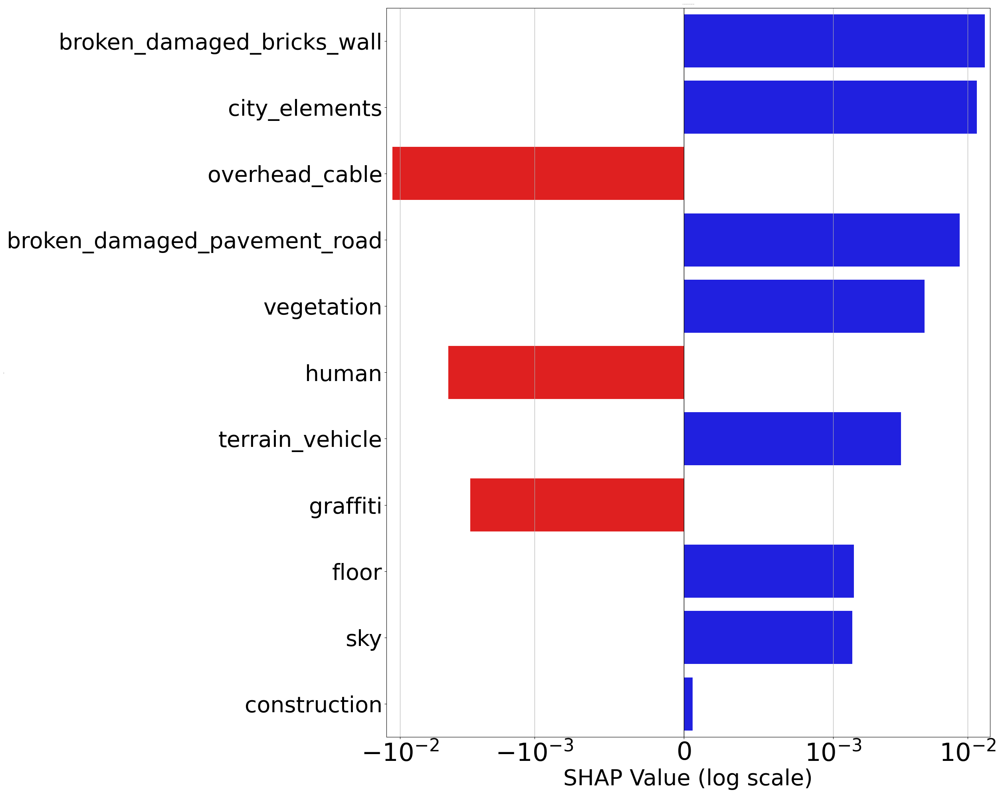

In [40]:
plt.figure(figsize=(25, 20))
sns.barplot(data=top_features, 
            y='feature', 
            x='value', 
            palette=top_features.set_index('feature')['color'].to_dict(),
           )

plt.xscale('symlog', linthresh=0.001)  # handles both positive and negative small values
plt.xlabel('SHAP Value (log scale)', fontsize=40)
plt.ylabel('Feature', fontsize=0)
plt.title('Top 15 SHAP Feature Contributions to safe', fontsize=0)
plt.xticks(fontsize=45)
plt.yticks(fontsize=40)
plt.axvline(0, color='black', linewidth=1)
plt.grid(True, axis='x', which='both')
plt.tight_layout()
plt.show()

### Both categories

In [41]:
shap_values_melt_df = shap_values_df_abs.reset_index().melt(id_vars='index', var_name='label', value_name='value')
shap_values_melt_df.rename(columns={'index': 'feature'}, inplace=True)

# Optionally map class labels
shap_values_melt_df["label"] = shap_values_melt_df["label"].apply(lambda x: label_map[x] if 'label_map' in globals() else x)

# Compute mean impacts
mean_shap_values_df = shap_values_df_abs.sum(axis=1).sort_values(ascending=False).reset_index()
top_k_features_names = mean_shap_values_df["index"][:15].values.tolist()

# Filter and sort
sort_df = shap_values_melt_df[shap_values_melt_df["feature"].isin(top_k_features_names)]
sort_df['feature'] = pd.Categorical(sort_df['feature'], categories=top_k_features_names, ordered=True)
sort_df.sort_values(by=['feature', 'label'], inplace=True)

# Pivot and plot
pivot_df = sort_df.pivot_table(index='feature', columns='label', values='value', aggfunc='sum', fill_value=0)

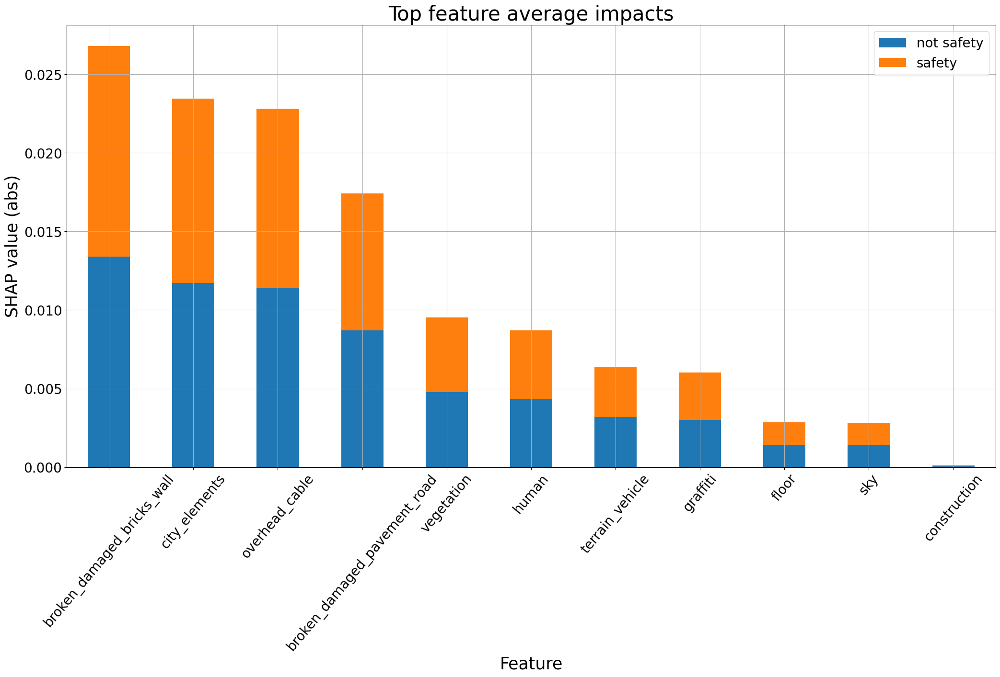

In [42]:
_, ax = plt.subplots(figsize=(25, 12))
pivot_df.plot(kind='bar', stacked=True, ax=ax)

ax.set_title("Top feature average impacts", fontsize=30)
ax.set_xlabel('Feature', fontsize=25)
ax.set_ylabel('SHAP value (abs)', fontsize=25)

ax.tick_params(axis='x', rotation=50, labelsize=20)
ax.tick_params(axis='y', labelsize=20)

ax.legend(fontsize=20)
ax.grid(True)

### Inferences

In [43]:
data_df = pp.data_df.copy()
y_pred_proba = tm.model_grid.predict_proba(data_df.iloc[:, 16:-2].values)
first_values = y_pred_proba[:, 0].tolist()
second_values = y_pred_proba[:, 1].tolist()
data_df["predict_class"] = np.argmax(y_pred_proba, axis=1).tolist()
data_df["predict_proba"] = np.max(y_pred_proba, axis=1).tolist()

### CounterFactual

In short, Wachter et al.'s method minimizes the loss:

$L(x, x', y', \lambda) = \lambda . (\hat{f}(x') - y')^2 + d(x, x')$

* The first term $\lambda . (\hat{f}(x') - y')^2$ minimizes the squared difference between the model prediction for the counterfactual $x'$, i.e., $\hat{f}(x')$ and the desired prediction (specified by the user) $y'$.  
   Note that $\lambda$ is a hyperparameter for weighting the importance of this left term over the second term, $d(x,x')$.

* The second term $d(x,x')$ calculates the distance between a given instance $x$ and a generated counterfactual $x'$. In short, the second term will keep the generated counterfactual similar to the instance.  
  In contrast, the first term maximizes the difference between the model prediction for the counterfactual and the desired prediction

* The distance function is implemented as the absolute difference in each feature dimension scaled by the median absolute deviation (MAD):  
   $d(x, x') = \sum_{j=1}^{p} \frac{|x_j - x'_j|}{MAD_j}$

**Note**

If you work with dicel_ml and do not want to print the tqdm, modify the file `conda_path/dice_ml/explainer_interfaces/explainer_base.py` line 182.

In [44]:
import dice_ml

In [45]:
unsafe_df = data_df[data_df["class"]==0].copy()

dice_data = dice_ml.Data(dataframe=unsafe_df.iloc[:, 16:-3].copy(),
                         continuous_features=feature_names,
                         outcome_name='class')

dice_model = dice_ml.Model(tm.model_grid, backend="sklearn")

exp = dice_ml.Dice(dice_data, dice_model)

In [50]:
from sklearn.metrics.pairwise import euclidean_distances

current_df = unsafe_df[unsafe_df["class"]==unsafe_df["predict_class"]].copy()

cf_diff_df = pd.DataFrame()
cf_num_diff_df = pd.DataFrame()
cf_df = pd.DataFrame()
unsafe2safe_df = pd.DataFrame()

for index, row in tqdm(current_df.iterrows()):
    sample = row[feature_names].to_frame().T
    id_ = row["image_id"]
    target_ = row["class"]

    try:
        dice_exp = exp.generate_counterfactuals(sample, 
                                                total_CFs=5, 
                                                desired_class=list(pp.label_map.values()).index("safety"),
                                                verbose=False,
                                                stopping_threshold=0.6, # minimal class probability of counterfactual
                                                #proximity_weight=1.0, # more close the counterfactuals are
                                                #sparsity_weight=2.0,   # less features are changed
                                                #diversity_weight=2.0, # more diverse the counterfactuals are.
                                                permitted_range={ obj_name: [0,0.5] for obj_name in feature_names},
                                                # features_to_vary=["tree", "building", "road"],
                                                random_seed=42)
        
        # CounterFactuals
        cf_values = dice_exp.cf_examples_list[0].final_cfs_df.iloc[:,:-1].copy()
        ## samples - counterfactuals
        values_diff = cf_values.subtract(sample.iloc[0], axis=1)
        values_diff["image_id"] = id_
        cf_diff_df = pd.concat([cf_diff_df, values_diff], ignore_index=True)
        ## number of changes
        number_diff = pd.DataFrame( values_diff.ne(0).astype(int).sum() ).T
        number_diff["image_id"] = id_
        cf_num_diff_df = pd.concat([cf_num_diff_df, number_diff], ignore_index=True)
        # ## values changed
        # values_changed = cf_values.subtract(sample.iloc[0], axis=1).ne(0).astype(int)
        # values_changed["image_id"] = id_
        
        # Most closest counterfactual
        ## Ecludiean distance
        distances = euclidean_distances(cf_values, sample)
        ## Get the index of the closest row
        closest_row_index = np.argmin(distances)
        ## Retrieve the closest row
        closest_row = cf_values.iloc[closest_row_index]
        ## Inferences
        orig_predict = tm.model_grid.predict_proba(sample)
        new_predict = tm.model_grid.predict_proba(closest_row.to_frame().T)
        diff_predict = orig_predict - new_predict
        ## Different values
        closest_row_diff = closest_row.subtract(sample.iloc[0]).to_frame().T
        closest_row_diff["image_id"] = id_
        ## probability difference
        diff_predict_value = diff_predict[:, 0].tolist()[0]
        ## probabilities
        closest_row_diff["orig_prob"] = [orig_predict]
        closest_row_diff["new_prob"] = [new_predict]
        closest_row_diff["diff_prob"] = diff_predict_value
        ## concatenate
        unsafe2safe_df = pd.concat([unsafe2safe_df, closest_row_diff], ignore_index=True)
        
        ## counterfatual values
        cf_values["image_id"] = id_
        cf_df = pd.concat([cf_df, cf_values], ignore_index=True)
    
    except Exception as e:
        print("Error:", e)
    

3it [00:00,  6.02it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


7it [00:01,  5.55it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


15it [00:02,  6.09it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


68it [00:16,  5.26it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


76it [00:17,  6.21it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


84it [00:18,  6.92it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


88it [00:19,  6.70it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


92it [00:20,  6.49it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


111it [00:23,  6.71it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


139it [00:29,  5.76it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


146it [00:31,  5.51it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


149it [00:31,  5.56it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


153it [00:32,  5.46it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


167it [00:44,  4.53it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


173it [00:45,  5.83it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


193it [00:49,  5.93it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


214it [00:53,  6.32it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


217it [00:53,  6.45it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


230it [00:56,  5.31it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


233it [00:56,  5.51it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


251it [00:59,  5.71it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


287it [01:05,  5.74it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


295it [01:07,  5.79it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


310it [01:10,  5.28it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


331it [01:33,  5.28it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


335it [01:34,  6.07it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


347it [01:36,  5.85it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


351it [01:37,  6.27it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


363it [01:51,  2.52it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


367it [01:51,  4.48it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


385it [01:55,  5.70it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


388it [01:55,  6.31it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


394it [01:56,  5.40it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


396it [01:57,  5.48it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


405it [01:58,  5.55it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


430it [02:03,  5.20it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


432it [02:03,  5.27it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


439it [02:04,  5.53it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


447it [02:06,  5.72it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


453it [02:06,  6.07it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


460it [02:08,  6.58it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


480it [02:35,  1.29s/it]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


483it [02:36,  1.81it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


490it [02:37,  4.89it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


504it [02:47,  4.99it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


518it [03:11,  1.07it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


522it [03:12,  2.66it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


523it [03:12,  3.14it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


530it [03:21,  2.22it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


539it [03:22,  6.01it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


542it [03:23,  5.95it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


558it [03:25,  5.72it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


568it [03:27,  5.58it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


583it [03:30,  6.79it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


588it [03:30,  6.59it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


589it [03:31,  6.16it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


593it [03:31,  5.48it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


595it [03:32,  5.43it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


601it [03:33,  5.72it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


615it [03:35,  6.25it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


638it [03:39,  5.80it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


643it [03:40,  4.89it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


648it [03:41,  5.46it/s]

No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.
No Counterfactuals found for the given configuration, perhaps try with different parameters... ; total time taken: 00 min 00 sec
Error: No counterfactuals found for any of the query points! Kindly check your configuration.


649it [03:41,  2.93it/s]


In [ ]:
def print_number_of_variations(features_df, fig_size=(40,30), top_k=None):
        try:
            fig, ax = plt.subplots(figsize=fig_size, nrows=1, ncols=1, sharex=False, sharey=False, constrained_layout=True)
            
            sorted_columns = features_df.median().sort_values(ascending=False).index.tolist()
            
            if top_k is not None:
                sorted_columns = sorted_columns[:top_k].copy()
            
            sns_fig = sns.boxplot(
                        data=features_df[sorted_columns],
                        orient="h",
                        # dodge=True,
                        flierprops=dict(marker='x', markersize=40, color='black', markeredgewidth=5),
                        # showfliers=True, 
                        medianprops=dict(color="green", linewidth=10),
                
                        notch=True, showcaps=False,
                        color="steelblue",
                        native_scale=True,
                        palette=uss.color_dict,
                        # order=estado_df.sort_values(estado_df.columns[1], ascending=False)[estado_df.columns[0]]
                       )
            
            sns_fig.set_title(f"CounterFactuals", fontsize=0)
            sns_fig.set_ylabel(f"", fontsize=0)
            sns_fig.set_xlabel('Number of variations', fontsize=70)
            
            # rotate the axis ticklabels
            _ = sns_fig.tick_params(axis='x', rotation=0, labelsize=55)
            
            # rotate the axis ticklabels
            _ = sns_fig.tick_params(axis='y', labelsize=80)

            xticks_ = list(range(0,cf_num_diff_df.iloc[:, :-1].values.max()+4,5))
            sns_fig.set_xticks(xticks_)
            sns_fig.set_xticklabels([str(i) for i in xticks_])

            
            # add a space on y for the annotations
            sns_fig.margins(x=0.1)
            ax.grid(True)
            
            plt.show()
        except Exception as e:
            print(e)

In [ ]:
print_number_of_variations(cf_num_diff_df.iloc[:, :-1], fig_size=(65,45), top_k=30)

### LLM

In [ ]:
unsafe2safe_df.sort_values(by="diff_prob", ascending=False, inplace=True)
unsafe2safe_df.tail(30)

In [ ]:
# Pixel ratio case
visual_elements = ["tree", "graffiti", "streetlight", "broken sidewalk", "car"]

x = [0.10, 0.15, 0.00, 0.08, 0.20]   # Original pixel ratios
x_prime = [0.25, 0.02, 0.03, 0.00, 0.18]  # Counterfactual pixel ratios

epsilon = 0.02  # Threshold for significance

added = []
removed = []

for i in range(len(visual_elements)):
    delta = x_prime[i] - x[i]
    if delta > epsilon:
        added.append(f"{visual_elements[i]}: increased from {int(x[i]*100)}% to {int(x_prime[i]*100)}%")
    elif delta < -epsilon:
        removed.append(f"{visual_elements[i]}: decreased from {int(x[i]*100)}% to {int(x_prime[i]*100)}%")

# Create prompt
prompt_pixel = f"""
You are an expert in urban planning and visual perception. Your task is to explain how changes in specific visual elements of a street scene might influence the way people perceive safety.

These changes come from comparing an original image with a counterfactual version.

[Added elements]:
{chr(10).join(added) if added else 'None'}

[Removed elements]:
{chr(10).join(removed) if removed else 'None'}

Please write a concise explanation (2–4 sentences) describing how these changes may affect safety perception. Focus on order, comfort, and social signals.
"""
print(prompt_pixel)

# Binary case: presence (1) or absence (0)
visual_elements = ["tree", "graffiti", "streetlight", "broken sidewalk", "car"]

x = [0, 1, 0, 1, 1]       # Original
x_prime = [1, 0, 1, 0, 1] # Counterfactual

# Calculate difference
delta = [x_p - x_o for x_o, x_p in zip(x, x_prime)]

added = [visual_elements[i] for i, d in enumerate(delta) if d == 1]
removed = [visual_elements[i] for i, d in enumerate(delta) if d == -1]

# Create prompt
prompt_binary = f"""
You are an expert in urban planning and visual perception. Your task is to explain how changes in specific visual elements of a street scene might influence the way people perceive safety.

These changes come from comparing an original image with a counterfactual version.

[Added elements]: {', '.join(added) if added else 'None'}
[Removed elements]: {', '.join(removed) if removed else 'None'}

Please write a concise explanation (2–4 sentences) describing how these changes may affect safety perception. Focus on order, comfort, and social signals.
"""
print(prompt_binary)